# Подключение библиотек

```Полезная инфа```: https://kernc.github.io/backtesting.py/doc/examples/Parameter%20Heatmap%20&%20Optimization.html

In [1]:
# Если не установилась библиотека backtesting, то устанавливаем вручную
!pip install git+https://github.com/kernc/backtesting.py.git@0ce24d80b1bcb8120d95d31dc3bb351b1052a27d

  Cloning https://github.com/kernc/backtesting.py.git (to revision 0ce24d80b1bcb8120d95d31dc3bb351b1052a27d) to /tmp/pip-req-build-un2w6dvb
  Running command git clone --filter=blob:none --quiet https://github.com/kernc/backtesting.py.git /tmp/pip-req-build-un2w6dvb
  Running command git rev-parse -q --verify 'sha^0ce24d80b1bcb8120d95d31dc3bb351b1052a27d'
  Running command git fetch -q https://github.com/kernc/backtesting.py.git 0ce24d80b1bcb8120d95d31dc3bb351b1052a27d
  Resolved https://github.com/kernc/backtesting.py.git to commit 0ce24d80b1bcb8120d95d31dc3bb351b1052a27d
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 12.9 MB/s eta 0:00:00 0:00:01
  Created wheel for Backtesting: filename=Backtesting-0.3.4.dev30+g0ce24d8-py3-none-any.whl size=175110 sha256=f8966baa629862cc0809130978ff5bd7ec90b96798e236

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly 
import ccxt
import talib

# Инструменты для работы с БД
from utils import influxdb_communication, candel_patterns

# Настройка начальной работы с InfluxDB

Если в вашей БД нет данных, то воспользуйтесь коммандой ниже. Она скачает котировку BTC/USDT с таймфреймами: ```15m, 30m, 1h, 2h, 4h, 8h, 12h, 1d```

Другие таймфреймы на данный момент не доступны

In [3]:
#influxdb_communication.create_all_timeframes_data("BTC/USDT")

Если при записи у вас что то пошло не так или по другим причинам данные в БД стали плохими, то воспользуйтесь коммандой ниже, чтобы дропнуть бакет с данными

In [3]:
#influxdb_communication.delete_all_data()

Если происходит ошибка, то поочередёно удаляйте все mesurments из бакета

In [4]:
#influxdb_communication.delete_measurement("yours_mesurments")

# Разработка стратегии

In [7]:
from backtesting import Backtest, Strategy
from backtesting.lib import plot_heatmaps
# Залезем во внутриности библиотеки, чтобы сделать кастомный индикатор
from backtesting.backtesting import _Indicator

/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:50: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


Loading BokehJS ...

In [6]:
def get_data_for_strategy_optimisation(ohlcv, window_period, window_every, close_threshold=0.2, long_threshold=0.8, mode="optimize"):
    global influxdb_communication, TIMEFRAME_FOR_STRATEGY

    # Перобрабатываем данные
    ohlcv = ohlcv.reset_index()
    if "index" in ohlcv.columns:
        ohlcv = ohlcv.rename(columns={"index": "Date"})
    
    # Расчёт паттернов
    ohlcv = candel_patterns.add_all_caldel_patterns(ohlcv)
    # Сохранение информации о паттернах в БД   
    influxdb_communication.add_caldel_patterns_data(ohlcv, "BTC/USDT", TIMEFRAME_FOR_STRATEGY)
    # Удаляем ненужные колонки
    ohlcv = ohlcv[["Date", "Close", "High", "Low", "Open", "Volume"]]

    # Создание запроса на агрегацию данных о свечах из БД
    if mode == "optimize":
        query = f'''
        from(bucket: "{influxdb_communication.INFLUXDB_BUCKET}")
          |> range(start: -inf)
          |> filter(fn: (r) => r._measurement == "BTC/USDT_{TIMEFRAME_FOR_STRATEGY}_candel_patterns")
          |> window(period: {window_period}, every: {window_every})
          |> sum()
          |> group(columns: ["_start"], mode: "by")
          |> sum(column: "_value")
          //|> pivot(rowKey: ["_start"], columnKey: ["_start"], valueColumn: "_value")
        '''
    else:
        query = f'''
        from(bucket: "{influxdb_communication.INFLUXDB_BUCKET}")
          |> range(start: -inf)
          |> filter(fn: (r) => r._measurement == "BTC/USDT_{TIMEFRAME_FOR_STRATEGY}_candel_patterns")
          |> window(period: {window_period}, every: {window_every})
          |> sum()
          |> group(columns: ["_start"], mode: "by")
          |> sum(column: "_value")
          //|> pivot(rowKey: ["_start"], columnKey: ["_start"], valueColumn: "_value")
        '''

    # Получение данных о паттернах
    patterns_result = influxdb_communication.query_df(query)
    patterns_result = patterns_result.rename(columns={"_start": "Date"})

    # Поиск трешхолдов 
    PATTERNS_CLOSE_THRESHOLD = patterns_result["_value"].quantile(close_threshold)
    PATTERNS_LONG_THRESHOLD = patterns_result["_value"].quantile(long_threshold)

    # Обработка финальных данных
    final_df = pd.merge(ohlcv, patterns_result, on="Date", how='left')
    final_df = final_df.drop(columns=["result", "table"])
    # Не очищаем данные от NAN, т.к. это изменит поведение стратегии, которое было в research.ipynb
    
    return final_df, PATTERNS_CLOSE_THRESHOLD, PATTERNS_LONG_THRESHOLD

In [8]:
class PatternsStrategy(Strategy):
    window_period = "12d"
    window_every = "4d"
    close_threshold = 0.2
    long_threshold = 0.8

    def init(self):
        # Расчитываем данные для паттерной стратегии
        data_for_strartegy = get_data_for_strategy_optimisation(
            self.data.df,
            self.window_period,
            self.window_every,
            self.close_threshold,
            self.long_threshold
        )
        
        # Сохраняем результаты как Index (придётся немного поломать функционал библиотеки)
        # https://github.com/kernc/backtesting.py/blob/master/backtesting/backtesting.py#L78
        value = _Indicator(
            data_for_strartegy[0]["_value"].values, name="pattern_indicator", 
            plot=False, overlay=False,
            color=None, scatter=False,
            index=self.data.index
        )
        self._indicators.append(value)
        self.pattern_indicator_value = value
        
        # Устанавливаем предельные значения для работы со сделками
        self.patterns_close_threshold = data_for_strartegy[1]
        self.patterns_long_threshold = data_for_strartegy[2]

    def next(self):
        current_signal = self.pattern_indicator_value[-1]
        
        if current_signal > self.patterns_long_threshold and not self.position.is_long:
            self.buy()
        elif current_signal < self.patterns_close_threshold and self.position.is_long:
            self.position.close()
        

Настройка констант

In [ ]:
TIMEFRAME_FOR_STRATEGY = "12h"
TRAIN_TEST_SPLIT_DATE = '2024-03-01'

In [ ]:
WINDOW_PERIOD = "12d"
WINDOW_EVERY = "4d"

Получение данных на которой будет тестироваться стратегия

In [9]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY, TRAIN_TEST_SPLIT_DATE)
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2017-08-17 12:00:00+00:00,4285.08,4485.39,4200.74,4436.06,649.441630
2017-08-18 00:00:00+00:00,4340.31,4371.52,4134.61,4285.08,720.722201
2017-08-18 12:00:00+00:00,4108.37,4340.31,3938.77,4320.52,479.166063
2017-08-19 00:00:00+00:00,3957.60,4184.69,3850.00,4108.37,298.518569
2017-08-19 12:00:00+00:00,4139.98,4149.99,3928.89,3945.12,82.791194
...,...,...,...,...,...
2024-02-27 12:00:00+00:00,57037.34,57588.15,56209.00,56527.80,32896.751710
2024-02-28 00:00:00+00:00,58941.11,59494.06,56691.85,57037.35,30464.620430
2024-02-28 12:00:00+00:00,62432.10,64000.00,58700.00,58941.11,88298.849410


In [11]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

output = bt.run(
    window_period="12d",
    window_every="4d",
    close_threshold=0.2,
    long_threshold=0.8
)
bt.plot()

GridPlot(id='p1318', ...)

In [12]:
output

Start                     2017-08-17 12:00...
End                       2024-02-29 12:00...
Duration                   2387 days 00:00:00
Exposure Time [%]                   49.895266
Equity Final [$]                   7275179.44
Equity Peak [$]                    7275179.44
Return [%]                         7175.17944
Buy & Hold Return [%]              1326.60067
Return (Ann.) [%]                   92.565415
Volatility (Ann.) [%]               96.546502
Sharpe Ratio                         0.958765
Sortino Ratio                        3.251458
Calmar Ratio                         1.772734
Max. Drawdown [%]                  -52.216185
Avg. Drawdown [%]                   -6.004466
Max. Drawdown Duration      844 days 12:00:00
Avg. Drawdown Duration       27 days 17:00:00
# Trades                                   26
Win Rate [%]                        73.076923
Best Trade [%]                     145.049371
Worst Trade [%]                    -21.889128
Avg. Trade [%]                    

Как можно увидеть даже без оптимизации параметров стратегия имеет сильный рост по получаемому доходу

# Оптимизация стратегии

Оптимизацию стратегий будем производить на таймфреймах: ```1h, 2h, 4h, 8h, 12h, 1d```. Более низкие значения таймфреймов требуют слишком много вычислительных ресурсов

P.s. не рекомендую запускать оптимизацию, т.к. она занимает большое кол-во времени

## 1 дневной таймфрейм

In [41]:
TIMEFRAME_FOR_STRATEGY = "1d"

In [42]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY, TRAIN_TEST_SPLIT_DATE)
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2017-08-18 00:00:00+00:00,4108.37,4371.52,3938.77,4285.08,1199.888264
2017-08-19 00:00:00+00:00,4139.98,4184.69,3850.00,4108.37,381.309763
2017-08-20 00:00:00+00:00,4086.29,4211.08,4032.62,4120.98,467.083022
2017-08-21 00:00:00+00:00,4016.00,4119.62,3911.79,4069.13,691.743060
2017-08-22 00:00:00+00:00,4040.00,4104.82,3400.00,4016.00,966.684858
...,...,...,...,...,...
2024-02-25 00:00:00+00:00,51728.85,51958.55,51279.80,51568.21,18721.631590
2024-02-26 00:00:00+00:00,54476.47,54910.00,50901.44,51728.85,51256.721990
2024-02-27 00:00:00+00:00,57037.34,57588.15,54450.13,54476.48,67194.985620


In [43]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

stats, heatmap = bt.optimize(
    window_period = ["6d", "8d", "10d", "12d", "14d", "16d", "18d", "20d"],
    window_every = ["1d", "2d", "3d", "4d", "5d", "6d"],
    close_threshold = [0.1, 0.15, 0.2, 0.25, 0.3, 0.4],
    long_threshold = [0.6, 0.7, 0.75, 0.8, 0.85, 0.9],
    #constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Sharpe Ratio',
    max_tries=250,
    random_state=0,
    return_heatmap=True)

In [44]:
#bt.plot()

/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  .resample(resample_rule, label='left')


GridPlot(id='p3312', ...)

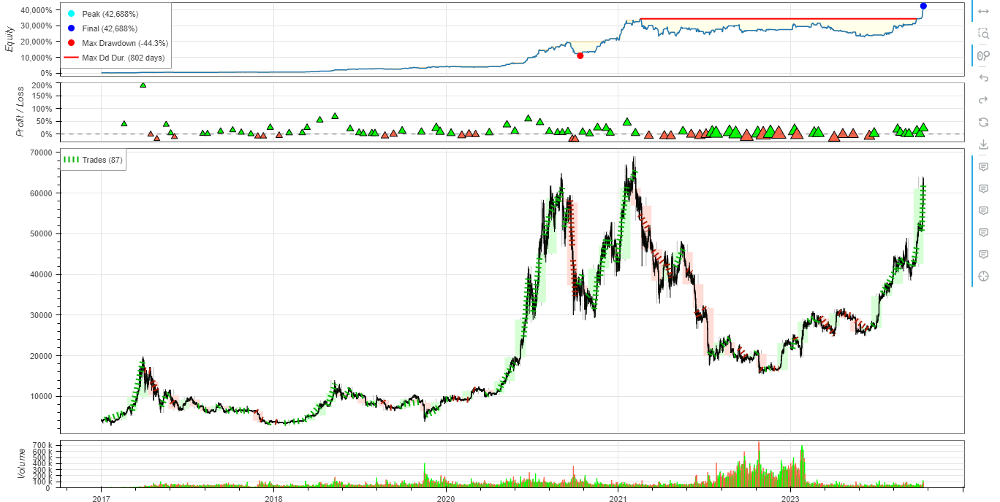

In [45]:
stats

Start                     2017-08-18 00:00...
End                       2024-02-29 00:00...
Duration                   2386 days 00:00:00
Exposure Time [%]                   57.938835
Equity Final [$]                  42687732.32
Equity Peak [$]                   42687732.32
Return [%]                        42587.73232
Buy & Hold Return [%]             1387.961892
Return (Ann.) [%]                  152.466561
Volatility (Ann.) [%]              138.997942
Sharpe Ratio                         1.096898
Sortino Ratio                        4.998982
Calmar Ratio                         3.441135
Max. Drawdown [%]                  -44.307051
Avg. Drawdown [%]                    -6.16968
Max. Drawdown Duration      802 days 00:00:00
Avg. Drawdown Duration       24 days 00:00:00
# Trades                                   87
Win Rate [%]                        68.965517
Best Trade [%]                     190.757589
Worst Trade [%]                    -20.342174
Avg. Trade [%]                    

In [46]:
plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p3629', ...)

In [47]:
print(stats._strategy._params)

{'window_period': '6d', 'window_every': '1d', 'close_threshold': 0.2, 'long_threshold': 0.7}


In [18]:
best_params_for_1d = {'window_period': '6d', 'window_every': '1d', 'close_threshold': 0.2, 'long_threshold': 0.7}

## 12 часовой таймфрейм

In [14]:
TIMEFRAME_FOR_STRATEGY = "12h"

In [15]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY, TRAIN_TEST_SPLIT_DATE)
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2017-08-17 12:00:00+00:00,4285.08,4485.39,4200.74,4436.06,649.441630
2017-08-18 00:00:00+00:00,4340.31,4371.52,4134.61,4285.08,720.722201
2017-08-18 12:00:00+00:00,4108.37,4340.31,3938.77,4320.52,479.166063
2017-08-19 00:00:00+00:00,3957.60,4184.69,3850.00,4108.37,298.518569
2017-08-19 12:00:00+00:00,4139.98,4149.99,3928.89,3945.12,82.791194
...,...,...,...,...,...
2024-02-27 12:00:00+00:00,57037.34,57588.15,56209.00,56527.80,32896.751710
2024-02-28 00:00:00+00:00,58941.11,59494.06,56691.85,57037.35,30464.620430
2024-02-28 12:00:00+00:00,62432.10,64000.00,58700.00,58941.11,88298.849410


In [34]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

stats, heatmap = bt.optimize(
    window_period = ["6d", "8d", "10d", "12d", "14d", "16d"],
    window_every = ["1d", "2d", "3d", "4d", "5d"],
    close_threshold = [0.1, 0.15, 0.2, 0.25, 0.3, 0.4],
    long_threshold = [0.6, 0.7, 0.75, 0.8, 0.85, 0.9],
    #constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Sharpe Ratio',
    max_tries=200,
    random_state=0,
    return_heatmap=True)

In [35]:
#bt.plot()

GridPlot(id='p2662', ...)

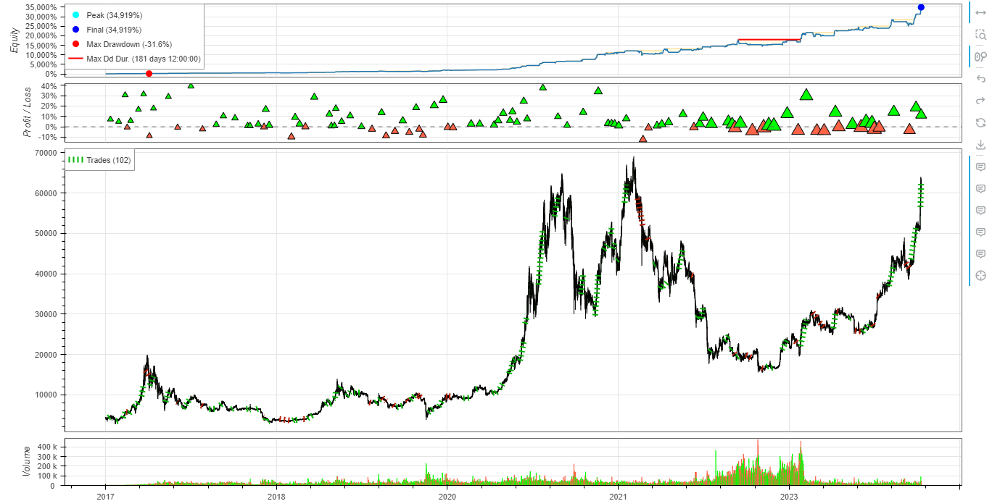

In [36]:
stats

Start                     2017-08-17 12:00...
End                       2024-02-29 12:00...
Duration                   2387 days 00:00:00
Exposure Time [%]                    41.30708
Equity Final [$]                  34918941.35
Equity Peak [$]                   34918941.35
Return [%]                        34818.94135
Buy & Hold Return [%]              1326.60067
Return (Ann.) [%]                  144.737606
Volatility (Ann.) [%]              104.775176
Sharpe Ratio                         1.381411
Sortino Ratio                        6.514296
Calmar Ratio                         4.579882
Max. Drawdown [%]                  -31.602911
Avg. Drawdown [%]                   -4.226141
Max. Drawdown Duration      181 days 12:00:00
Avg. Drawdown Duration       14 days 12:00:00
# Trades                                  102
Win Rate [%]                        71.568627
Best Trade [%]                       38.96312
Worst Trade [%]                    -12.329769
Avg. Trade [%]                    

In [37]:
plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p2979', ...)

In [38]:
print(stats._strategy._params)

{'window_period': '6d', 'window_every': '1d', 'close_threshold': 0.4, 'long_threshold': 0.75}


In [19]:
best_params_for_12h = {'window_period': '6d', 'window_every': '1d', 'close_threshold': 0.4, 'long_threshold': 0.75}

## 8 часовой таймфрейм

In [6]:
TIMEFRAME_FOR_STRATEGY = "8h"

In [7]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY, TRAIN_TEST_SPLIT_DATE)
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2017-08-17 08:00:00+00:00,4352.34,4485.39,4333.32,4333.32,238.181883
2017-08-17 16:00:00+00:00,4285.08,4369.69,4200.74,4352.33,474.879629
2017-08-18 00:00:00+00:00,4300.25,4340.62,4134.61,4285.08,524.582072
2017-08-18 08:00:00+00:00,4236.89,4371.52,4193.70,4285.00,372.109513
2017-08-18 16:00:00+00:00,4108.37,4297.75,3938.77,4234.54,303.196679
...,...,...,...,...,...
2024-02-28 08:00:00+00:00,60966.22,61360.00,58171.11,58241.09,45593.121140
2024-02-28 16:00:00+00:00,62432.10,64000.00,58700.00,60966.22,61929.931210
2024-02-29 00:00:00+00:00,62707.17,63676.35,61021.10,62432.11,25015.183080


In [10]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

stats, heatmap = bt.optimize(
    window_period = ["12h", "1d", "3d", "4d", "5d"],
    window_every = ["12h", "1d", "2d", "3d", "4d"],
    close_threshold = [0.1, 0.15, 0.2, 0.25, 0.3, 0.4],
    long_threshold = [0.6, 0.7, 0.75, 0.8, 0.85, 0.9],
    #constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Sharpe Ratio',
    max_tries=150,
    random_state=0,
    return_heatmap=True)

In [11]:
bt.plot()

GridPlot(id='p1318', ...)

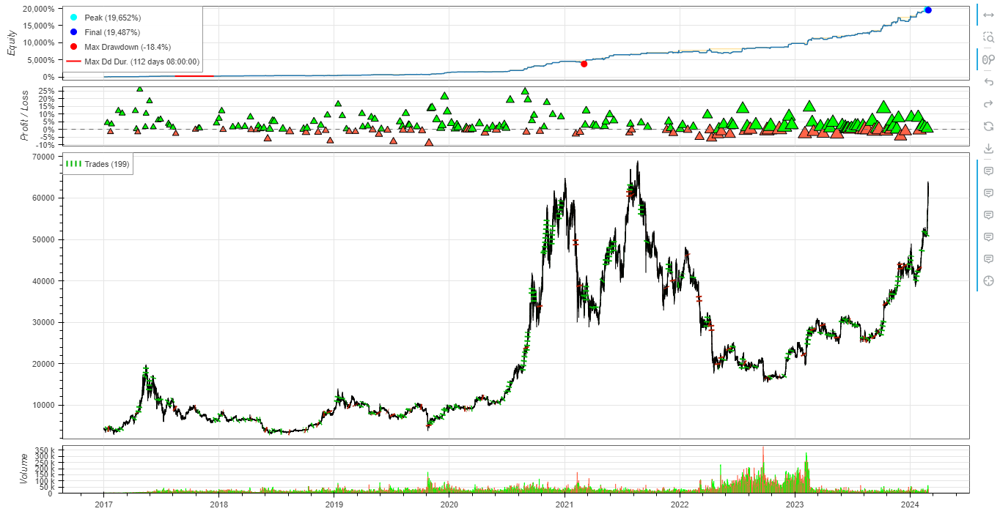

In [12]:
stats

Start                     2017-08-17 08:00...
End                       2024-02-29 16:00...
Duration                   2387 days 08:00:00
Exposure Time [%]                   25.530726
Equity Final [$]                  19486756.37
Equity Peak [$]                   19651844.98
Return [%]                        19386.75637
Buy & Hold Return [%]             1304.554332
Return (Ann.) [%]                  123.862387
Volatility (Ann.) [%]               70.625102
Sharpe Ratio                         1.753801
Sortino Ratio                        8.723462
Calmar Ratio                         6.745946
Max. Drawdown [%]                   -18.36101
Avg. Drawdown [%]                   -2.523134
Max. Drawdown Duration      112 days 08:00:00
Avg. Drawdown Duration       11 days 10:00:00
# Trades                                  199
Win Rate [%]                        68.341709
Best Trade [%]                      25.965942
Worst Trade [%]                     -9.148862
Avg. Trade [%]                    

In [13]:
plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p1635', ...)

In [14]:
print(stats._strategy._params)

{'window_period': '1d', 'window_every': '12h', 'close_threshold': 0.4, 'long_threshold': 0.85}


In [20]:
best_params_for_8h = {'window_period': '1d', 'window_every': '12h', 'close_threshold': 0.4, 'long_threshold': 0.85}

## 4 часовой таймфрейм

In [11]:
TIMEFRAME_FOR_STRATEGY = "4h"

In [12]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY, TRAIN_TEST_SPLIT_DATE)
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2017-08-17 04:00:00+00:00,4349.99,4349.99,4261.32,4261.48,82.088865
2017-08-17 08:00:00+00:00,4427.30,4485.39,4333.32,4333.32,63.619882
2017-08-17 12:00:00+00:00,4352.34,4485.39,4333.42,4436.06,174.562001
2017-08-17 16:00:00+00:00,4325.23,4354.84,4200.74,4352.33,225.109716
2017-08-17 20:00:00+00:00,4285.08,4369.69,4258.56,4307.56,249.769913
...,...,...,...,...,...
2024-02-29 04:00:00+00:00,62707.17,63676.35,61334.59,61561.34,14931.154570
2024-02-29 08:00:00+00:00,62936.02,63340.95,62111.10,62707.17,11918.804760
2024-02-29 12:00:00+00:00,62768.02,63531.88,62051.11,62936.02,12976.741610


In [21]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

stats, heatmap = bt.optimize(
    window_period = ["1d", "3d", "4d", "5d"],
    window_every = ["2d", "3d", "4d"],
    close_threshold = [0.1, 0.15, 0.2, 0.25, 0.3, 0.4],
    long_threshold = [0.6, 0.7, 0.75, 0.8, 0.85, 0.9],
    #constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Sharpe Ratio',
    max_tries=150,
    random_state=0,
    return_heatmap=True)

In [22]:
bt.plot()

/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:122: UserWarning: Data contains too many candlesticks to plot; downsampling to '8H'. See `Backtest.plot(resample=...)`
  warnings.warn(f"Data contains too many candlesticks to plot; downsampling to {freq!r}. "
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:126: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df = df.resample(freq, label='right').agg(OHLCV_AGG).dropna()
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:128: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  indicators = [_Indicator(i.df.resample(freq, label='right').mean()
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:136: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  equity_data = equity_data.resample(freq, label='right').agg(_EQUITY_AGG).dropna(how='a

GridPlot(id='p1969', ...)

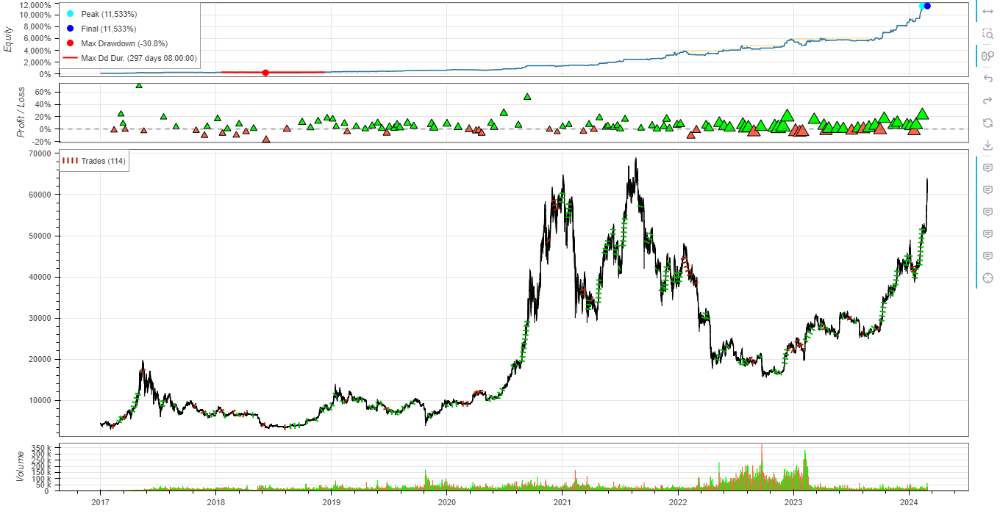

In [23]:
stats

Start                     2017-08-17 04:00...
End                       2024-02-29 20:00...
Duration                   2387 days 16:00:00
Exposure Time [%]                   37.509608
Equity Final [$]                  11533429.78
Equity Peak [$]                   11533429.78
Return [%]                        11433.42978
Buy & Hold Return [%]             1305.313116
Return (Ann.) [%]                  106.616664
Volatility (Ann.) [%]               76.984802
Sharpe Ratio                         1.384905
Sortino Ratio                        5.279805
Calmar Ratio                          3.45874
Max. Drawdown [%]                  -30.825294
Avg. Drawdown [%]                   -3.335284
Max. Drawdown Duration      297 days 12:00:00
Avg. Drawdown Duration       11 days 16:00:00
# Trades                                  114
Win Rate [%]                        72.807018
Best Trade [%]                      69.678455
Worst Trade [%]                    -17.850424
Avg. Trade [%]                    

In [24]:
plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p2287', ...)

In [25]:
print(stats._strategy._params)

{'window_period': '4d', 'window_every': '2d', 'close_threshold': 0.4, 'long_threshold': 0.75}


In [21]:
best_params_for_4h = {'window_period': '4d', 'window_every': '2d', 'close_threshold': 0.4, 'long_threshold': 0.75}

## 2 часовой таймфрейм

In [13]:
TIMEFRAME_FOR_STRATEGY = "2h"

In [14]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY, TRAIN_TEST_SPLIT_DATE)
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2017-08-17 04:00:00+00:00,4315.32,4328.69,4261.32,4261.48,70.415925
2017-08-17 06:00:00+00:00,4349.99,4349.99,4287.41,4330.29,11.672940
2017-08-17 08:00:00+00:00,4444.00,4445.78,4333.32,4333.32,11.736430
2017-08-17 10:00:00+00:00,4427.30,4485.39,4399.81,4441.10,51.883452
2017-08-17 12:00:00+00:00,4459.00,4459.00,4411.00,4436.06,54.344834
...,...,...,...,...,...
2024-02-29 14:00:00+00:00,62768.02,63531.88,62566.01,62931.66,6712.865120
2024-02-29 16:00:00+00:00,60982.35,62879.30,60501.00,62768.01,10866.888550
2024-02-29 18:00:00+00:00,61600.00,61635.95,60364.70,60982.35,6251.352550


In [15]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

stats, heatmap = bt.optimize(
    window_period = ["1d", "2d", "3d"],
    window_every = ["1d", "2d", "3d"],
    close_threshold = [0.1, 0.15, 0.2, 0.25, 0.3, 0.4],
    long_threshold = [0.6, 0.7, 0.75, 0.8, 0.85, 0.9],
    #constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Sharpe Ratio',
    max_tries=150,
    random_state=0,
    return_heatmap=True)

In [16]:
bt.plot()

/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:122: UserWarning: Data contains too many candlesticks to plot; downsampling to '8H'. See `Backtest.plot(resample=...)`
  warnings.warn(f"Data contains too many candlesticks to plot; downsampling to {freq!r}. "
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:126: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df = df.resample(freq, label='right').agg(OHLCV_AGG).dropna()
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:128: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  indicators = [_Indicator(i.df.resample(freq, label='right').mean()
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:136: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  equity_data = equity_data.resample(freq, label='right').agg(_EQUITY_AGG).dropna(how='a

GridPlot(id='p1318', ...)

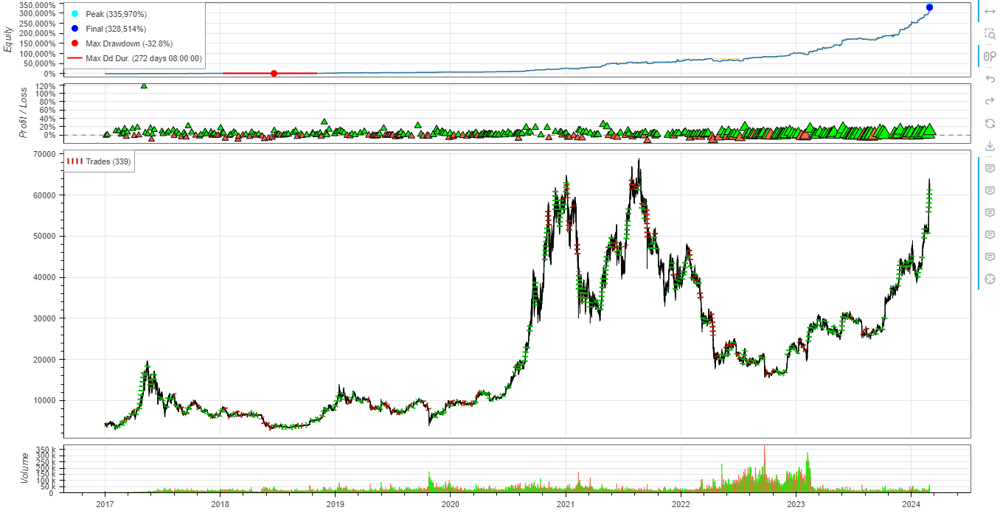

In [17]:
stats

Start                     2017-08-17 04:00...
End                       2024-02-29 22:00...
Duration                   2387 days 18:00:00
Exposure Time [%]                   42.823677
Equity Final [$]                 328514148.71
Equity Peak [$]                  336868995.35
Return [%]                       328414.14871
Buy & Hold Return [%]             1316.603635
Return (Ann.) [%]                  244.744027
Volatility (Ann.) [%]              150.779261
Sharpe Ratio                         1.623194
Sortino Ratio                        11.92073
Calmar Ratio                         7.462421
Max. Drawdown [%]                  -32.796865
Avg. Drawdown [%]                   -2.227982
Max. Drawdown Duration      272 days 08:00:00
Avg. Drawdown Duration        4 days 14:00:00
# Trades                                  339
Win Rate [%]                        68.731563
Best Trade [%]                     116.447214
Worst Trade [%]                    -13.234432
Avg. Trade [%]                    

In [18]:
plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p1636', ...)

In [19]:
print(stats._strategy._params)

{'window_period': '1d', 'window_every': '1d', 'close_threshold': 0.4, 'long_threshold': 0.75}


In [22]:
best_params_for_2h = {'window_period': '1d', 'window_every': '1d', 'close_threshold': 0.4, 'long_threshold': 0.75}

## 1 часовой таймфрейм

In [10]:
TIMEFRAME_FOR_STRATEGY = "1h"

In [11]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY, TRAIN_TEST_SPLIT_DATE)
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2017-08-17 04:00:00+00:00,4308.83,4313.62,4261.32,4261.48,47.181009
2017-08-17 05:00:00+00:00,4315.32,4328.69,4291.37,4308.83,23.234916
2017-08-17 06:00:00+00:00,4324.35,4345.45,4309.37,4330.29,7.229691
2017-08-17 07:00:00+00:00,4349.99,4349.99,4287.41,4316.62,4.443249
2017-08-17 08:00:00+00:00,4360.69,4377.85,4333.32,4333.32,0.972807
...,...,...,...,...,...
2024-02-29 19:00:00+00:00,61600.00,61635.95,60605.93,60799.99,2635.058170
2024-02-29 20:00:00+00:00,61934.73,62285.47,61521.73,61599.99,3755.220100
2024-02-29 21:00:00+00:00,61374.94,61999.75,60584.07,61934.73,4040.139080


In [12]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

stats, heatmap = bt.optimize(
    window_period = ["12h", "1d", "2d"],
    window_every = ["2d", "3d", "4d"],
    close_threshold = [0.1, 0.15, 0.2, 0.25, 0.3, 0.4, 0.5],
    long_threshold = [0.6, 0.7, 0.75, 0.8, 0.85, 0.9],
    #constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
    maximize='Sharpe Ratio',
    max_tries=150,
    random_state=0,
    return_heatmap=True)

In [13]:
bt.plot()

/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:122: UserWarning: Data contains too many candlesticks to plot; downsampling to '8H'. See `Backtest.plot(resample=...)`
  warnings.warn(f"Data contains too many candlesticks to plot; downsampling to {freq!r}. "
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:126: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df = df.resample(freq, label='right').agg(OHLCV_AGG).dropna()
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:128: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  indicators = [_Indicator(i.df.resample(freq, label='right').mean()
/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:136: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  equity_data = equity_data.resample(freq, label='right').agg(_EQUITY_AGG).dropna(how='a

GridPlot(id='p1318', ...)

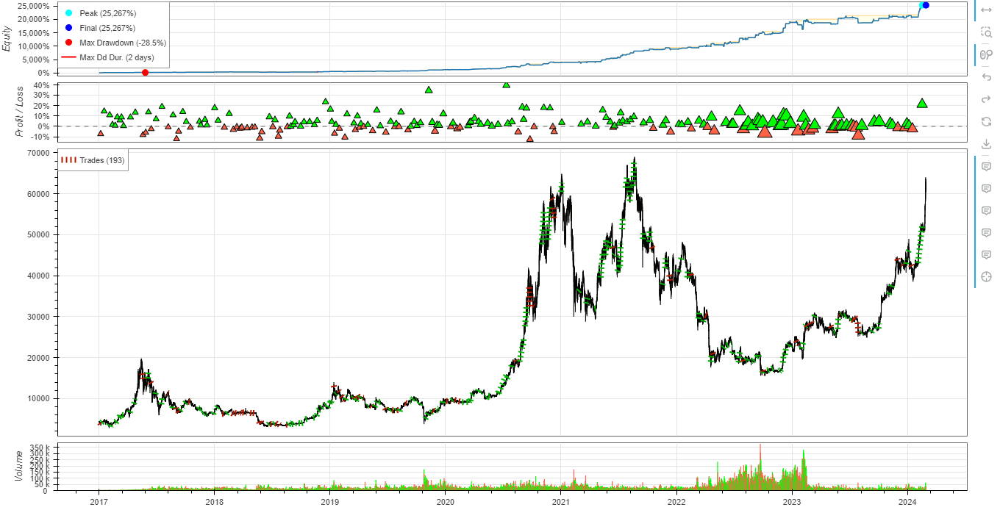

In [14]:
stats

Start                     2017-08-17 04:00...
End                       2024-02-29 23:00...
Duration                   2387 days 19:00:00
Exposure Time [%]                    34.63099
Equity Final [$]                  25266527.73
Equity Peak [$]                   25478321.29
Return [%]                        25166.52773
Buy & Hold Return [%]             1318.737337
Return (Ann.) [%]                  132.928835
Volatility (Ann.) [%]               90.960265
Sharpe Ratio                         1.461395
Sortino Ratio                        6.476149
Calmar Ratio                         4.665981
Max. Drawdown [%]                  -28.488938
Avg. Drawdown [%]                   -2.341883
Max. Drawdown Duration      208 days 23:00:00
Avg. Drawdown Duration        4 days 23:00:00
# Trades                                  193
Win Rate [%]                        68.393782
Best Trade [%]                       39.26385
Worst Trade [%]                    -12.543443
Avg. Trade [%]                    

In [15]:
plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p1636', ...)

In [16]:
print(stats._strategy._params)

{'window_period': '2d', 'window_every': '2d', 'close_threshold': 0.5, 'long_threshold': 0.75}


In [23]:
best_params_for_1h = {'window_period': '2d', 'window_every': '2d', 'close_threshold': 0.5, 'long_threshold': 0.75}

# Тестирование оптимизированных стратегий

Этот участок не занимает много вычислительных ресурсов, по этому его можно спокойно запускать

## 1 дневной таймфрейм

In [34]:
TIMEFRAME_FOR_STRATEGY = "1d"

In [35]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY)
btc_usdt = btc_usdt[btc_usdt["Date"] > TRAIN_TEST_SPLIT_DATE]
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2024-03-02 00:00:00+00:00,61987.28,62433.19,61561.12,62387.90,25534.73659
2024-03-03 00:00:00+00:00,63113.97,63231.88,61320.00,61987.28,28994.90903
2024-03-04 00:00:00+00:00,68245.71,68499.00,62300.00,63113.97,84835.16005
2024-03-05 00:00:00+00:00,63724.01,69000.00,59005.00,68245.71,132696.78130
2024-03-06 00:00:00+00:00,66074.04,67641.10,62779.14,63724.01,78738.85491
...,...,...,...,...,...
2024-09-06 00:00:00+00:00,53962.97,57008.00,52550.00,56180.00,54447.76826
2024-09-07 00:00:00+00:00,54160.86,54850.00,53745.54,53962.97,16694.04774
2024-09-08 00:00:00+00:00,54869.95,55318.00,53629.01,54160.86,16274.14779


In [36]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

output = bt.run(
    window_period=best_params_for_1d["window_period"],
    window_every=best_params_for_1d["window_every"],
    close_threshold=best_params_for_1d["close_threshold"],
    long_threshold=best_params_for_1d["long_threshold"]
)

In [37]:
bt.plot()

/usr/local/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  .resample(resample_rule, label='left')


GridPlot(id='p1969', ...)

In [38]:
output

Start                     2024-03-02 00:00...
End                       2024-09-10 00:00...
Duration                    192 days 00:00:00
Exposure Time [%]                   61.139896
Equity Final [$]                    114598.72
Equity Peak [$]                     120164.94
Return [%]                           14.59872
Buy & Hold Return [%]               -6.934923
Return (Ann.) [%]                   29.395831
Volatility (Ann.) [%]               32.232319
Sharpe Ratio                         0.911999
Sortino Ratio                        2.032462
Calmar Ratio                         3.012844
Max. Drawdown [%]                   -9.756839
Avg. Drawdown [%]                    -3.61445
Max. Drawdown Duration       56 days 00:00:00
Avg. Drawdown Duration       14 days 00:00:00
# Trades                                    6
Win Rate [%]                        66.666667
Best Trade [%]                      15.476879
Worst Trade [%]                     -3.534644
Avg. Trade [%]                    

## 12 часовой таймфрейм

In [39]:
TIMEFRAME_FOR_STRATEGY = "12h"

In [40]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY)
btc_usdt = btc_usdt[btc_usdt["Date"] > TRAIN_TEST_SPLIT_DATE]
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2024-03-01 12:00:00+00:00,62387.90,63114.23,61131.01,61863.71,27220.67337
2024-03-02 00:00:00+00:00,61826.32,62433.19,61641.10,62387.90,14699.84025
2024-03-02 12:00:00+00:00,61987.28,62200.00,61561.12,61826.32,10834.89634
2024-03-03 00:00:00+00:00,61831.10,62100.00,61320.00,61987.28,11901.41028
2024-03-03 12:00:00+00:00,63113.97,63231.88,61821.09,61831.10,17093.49875
...,...,...,...,...,...
2024-09-08 12:00:00+00:00,54869.95,55318.00,53629.01,54556.08,10806.68237
2024-09-09 00:00:00+00:00,55264.87,55555.00,54591.96,54869.95,11419.92949
2024-09-09 12:00:00+00:00,57042.00,58088.00,54804.00,55264.87,20964.58788


In [41]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

output = bt.run(
    window_period=best_params_for_12h["window_period"],
    window_every=best_params_for_12h["window_every"],
    close_threshold=best_params_for_12h["close_threshold"],
    long_threshold=best_params_for_12h["long_threshold"]
)

In [42]:
bt.plot()

GridPlot(id='p2316', ...)

In [43]:
output

Start                     2024-03-01 12:00...
End                       2024-09-10 12:00...
Duration                    193 days 00:00:00
Exposure Time [%]                   39.793282
Equity Final [$]                     91799.15
Equity Peak [$]                     106049.29
Return [%]                           -8.20085
Buy & Hold Return [%]                -7.53013
Return (Ann.) [%]                  -14.869919
Volatility (Ann.) [%]               19.894604
Sharpe Ratio                        -0.747435
Sortino Ratio                       -0.903139
Calmar Ratio                        -0.668784
Max. Drawdown [%]                  -22.234265
Avg. Drawdown [%]                   -6.897312
Max. Drawdown Duration      155 days 12:00:00
Avg. Drawdown Duration       37 days 20:00:00
# Trades                                    6
Win Rate [%]                        33.333333
Best Trade [%]                        6.65102
Worst Trade [%]                     -8.869619
Avg. Trade [%]                    

## 8 часовой таймфрейм

In [44]:
TIMEFRAME_FOR_STRATEGY = "8h"

In [45]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY)
btc_usdt = btc_usdt[btc_usdt["Date"] > TRAIN_TEST_SPLIT_DATE]
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2024-03-01 08:00:00+00:00,61263.99,62677.06,61131.01,61434.00,18423.55896
2024-03-01 16:00:00+00:00,62387.90,63114.23,61234.00,61263.98,17249.39432
2024-03-02 00:00:00+00:00,62011.85,62433.19,61752.30,62387.90,10288.26836
2024-03-02 08:00:00+00:00,61771.20,62167.79,61561.12,62011.85,8712.92273
2024-03-02 16:00:00+00:00,61987.28,62200.00,61625.00,61771.21,6533.54550
...,...,...,...,...,...
2024-09-09 08:00:00+00:00,55386.00,55799.00,54804.00,54974.01,9971.65859
2024-09-09 16:00:00+00:00,57042.00,58088.00,55348.54,55385.99,14422.10555
2024-09-10 00:00:00+00:00,57218.57,57290.00,56386.40,57042.01,6559.25121


In [46]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

output = bt.run(
    window_period=best_params_for_8h["window_period"],
    window_every=best_params_for_8h["window_every"],
    close_threshold=best_params_for_8h["close_threshold"],
    long_threshold=best_params_for_8h["long_threshold"]
)

In [47]:
bt.plot()

GridPlot(id='p2663', ...)

In [48]:
output

Start                     2024-03-01 08:00...
End                       2024-09-10 16:00...
Duration                    193 days 08:00:00
Exposure Time [%]                   30.292599
Equity Final [$]                     123356.1
Equity Peak [$]                     123356.12
Return [%]                            23.3561
Buy & Hold Return [%]               -5.830489
Return (Ann.) [%]                   48.427221
Volatility (Ann.) [%]               22.972098
Sharpe Ratio                         2.108089
Sortino Ratio                        6.068058
Calmar Ratio                         6.294641
Max. Drawdown [%]                   -7.693405
Avg. Drawdown [%]                   -1.439649
Max. Drawdown Duration       50 days 00:00:00
Avg. Drawdown Duration        8 days 18:00:00
# Trades                                   17
Win Rate [%]                        76.470588
Best Trade [%]                       8.651059
Worst Trade [%]                     -6.031403
Avg. Trade [%]                    

## 4 часовой таймфрейм

In [49]:
TIMEFRAME_FOR_STRATEGY = "4h"

In [50]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY)
btc_usdt = btc_usdt[btc_usdt["Date"] > TRAIN_TEST_SPLIT_DATE]
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2024-03-01 04:00:00+00:00,61434.00,61772.82,61061.11,61105.92,5719.40504
2024-03-01 08:00:00+00:00,61863.72,62243.53,61316.67,61434.00,8452.27991
2024-03-01 12:00:00+00:00,61263.99,62677.06,61131.01,61863.71,9971.27905
2024-03-01 16:00:00+00:00,62215.50,62494.31,61234.00,61263.98,7886.35574
2024-03-01 20:00:00+00:00,62387.90,63114.23,62215.50,62215.51,9363.03858
...,...,...,...,...,...
2024-09-10 00:00:00+00:00,56524.74,57065.34,56522.86,57042.01,3589.26607
2024-09-10 04:00:00+00:00,57218.57,57290.00,56386.40,56524.74,2969.98514
2024-09-10 08:00:00+00:00,57228.00,57378.00,56878.65,57218.56,3523.74246


In [51]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

output = bt.run(
    window_period=best_params_for_4h["window_period"],
    window_every=best_params_for_4h["window_every"],
    close_threshold=best_params_for_4h["close_threshold"],
    long_threshold=best_params_for_4h["long_threshold"]
)

In [52]:
bt.plot()

GridPlot(id='p3010', ...)

In [53]:
output

Start                     2024-03-01 04:00...
End                       2024-09-10 16:00...
Duration                    193 days 12:00:00
Exposure Time [%]                   39.070568
Equity Final [$]                    120946.98
Equity Peak [$]                      133701.0
Return [%]                           20.94698
Buy & Hold Return [%]               -6.091073
Return (Ann.) [%]                   43.020359
Volatility (Ann.) [%]                36.22203
Sharpe Ratio                         1.187685
Sortino Ratio                        3.465915
Calmar Ratio                         3.969152
Max. Drawdown [%]                  -10.838677
Avg. Drawdown [%]                   -2.203532
Max. Drawdown Duration      120 days 04:00:00
Avg. Drawdown Duration       12 days 09:00:00
# Trades                                   10
Win Rate [%]                             60.0
Best Trade [%]                      13.856744
Worst Trade [%]                     -8.011568
Avg. Trade [%]                    

## 2 часовой таймфрейм

In [54]:
TIMEFRAME_FOR_STRATEGY = "2h"

In [55]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY)
btc_usdt = btc_usdt[btc_usdt["Date"] > TRAIN_TEST_SPLIT_DATE]
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2024-03-01 02:00:00+00:00,61105.91,61222.22,60777.00,61214.35,2925.52253
2024-03-01 04:00:00+00:00,61312.01,61546.35,61061.11,61105.92,2137.26384
2024-03-01 06:00:00+00:00,61434.00,61772.82,61201.10,61312.01,3582.14120
2024-03-01 08:00:00+00:00,62129.15,62243.53,61316.67,61434.00,5194.25028
2024-03-01 10:00:00+00:00,61863.72,62188.00,61811.01,62129.14,3258.02963
...,...,...,...,...,...
2024-09-10 10:00:00+00:00,57228.00,57260.00,56947.13,57086.01,1248.87551
2024-09-10 12:00:00+00:00,56741.09,57468.98,56630.56,57228.01,2863.82202
2024-09-10 14:00:00+00:00,56596.00,57210.00,56502.31,56741.10,3273.20523


In [56]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

output = bt.run(
    window_period=best_params_for_2h["window_period"],
    window_every=best_params_for_2h["window_every"],
    close_threshold=best_params_for_2h["close_threshold"],
    long_threshold=best_params_for_2h["long_threshold"]
)

In [57]:
bt.plot()

GridPlot(id='p3357', ...)

In [58]:
output

Start                     2024-03-01 02:00...
End                       2024-09-10 18:00...
Duration                    193 days 16:00:00
Exposure Time [%]                   38.193548
Equity Final [$]                    115983.67
Equity Peak [$]                     116540.29
Return [%]                           15.98367
Buy & Hold Return [%]               -5.586874
Return (Ann.) [%]                   32.177951
Volatility (Ann.) [%]               25.946055
Sharpe Ratio                         1.240187
Sortino Ratio                        2.824365
Calmar Ratio                         3.319565
Max. Drawdown [%]                   -9.693424
Avg. Drawdown [%]                   -1.944129
Max. Drawdown Duration       76 days 16:00:00
Avg. Drawdown Duration        8 days 16:00:00
# Trades                                   28
Win Rate [%]                        60.714286
Best Trade [%]                       6.248614
Worst Trade [%]                     -5.114081
Avg. Trade [%]                    

## 1 часовой таймфрейм

In [59]:
TIMEFRAME_FOR_STRATEGY = "1h"

In [60]:
btc_usdt = influxdb_communication.read_data("BTC/USDT", TIMEFRAME_FOR_STRATEGY)
btc_usdt = btc_usdt[btc_usdt["Date"] > TRAIN_TEST_SPLIT_DATE]
btc_usdt = btc_usdt.set_index("Date")
btc_usdt

,Close,High,Low,Open,Volume
Date,,,,,
2024-03-01 01:00:00+00:00,61214.35,61566.95,61125.40,61501.10,1552.25486
2024-03-01 02:00:00+00:00,60980.00,61214.36,60781.25,61214.35,1600.91093
2024-03-01 03:00:00+00:00,61105.91,61222.22,60777.00,60980.00,1324.61160
2024-03-01 04:00:00+00:00,61524.09,61524.09,61061.11,61105.92,1067.62569
2024-03-01 05:00:00+00:00,61312.01,61546.35,61295.86,61524.08,1069.63815
...,...,...,...,...,...
2024-09-10 14:00:00+00:00,56941.09,57165.99,56502.31,56741.10,1919.82830
2024-09-10 15:00:00+00:00,56596.00,57210.00,56596.00,56941.09,1353.37693
2024-09-10 16:00:00+00:00,56819.60,56945.94,56566.00,56596.01,788.17727


In [61]:
bt = Backtest(btc_usdt, PatternsStrategy,
              cash=100000, commission=0,
              exclusive_orders=True)

output = bt.run(
    window_period=best_params_for_1h["window_period"],
    window_every=best_params_for_1h["window_every"],
    close_threshold=best_params_for_1h["close_threshold"],
    long_threshold=best_params_for_1h["long_threshold"]
)

In [62]:
bt.plot()

GridPlot(id='p3704', ...)

In [63]:
output

Start                     2024-03-01 01:00...
End                       2024-09-10 18:00...
Duration                    193 days 17:00:00
Exposure Time [%]                   33.397849
Equity Final [$]                    113540.38
Equity Peak [$]                      117988.5
Return [%]                           13.54038
Buy & Hold Return [%]               -5.776995
Return (Ann.) [%]                   26.987872
Volatility (Ann.) [%]               21.997727
Sharpe Ratio                         1.226848
Sortino Ratio                         2.65145
Calmar Ratio                         3.034962
Max. Drawdown [%]                   -8.892325
Avg. Drawdown [%]                   -1.254681
Max. Drawdown Duration       58 days 21:00:00
Avg. Drawdown Duration        4 days 08:00:00
# Trades                                   17
Win Rate [%]                        64.705882
Best Trade [%]                       8.786227
Worst Trade [%]                     -7.139507
Avg. Trade [%]                    

# Выводы

Как можно увидеть на некоторых таймфреймах оптимизированная стратегия показывает хорошие результаты. Но над этой стратегией требуется работа: добавление стоп лоссов (маркет типа) и добавление других инструментов контроля рисков, оптимизация стратегии в плане её стабилизации на получение постоянной прибыли